In [54]:
import json
import os
import numpy as np
import requests
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [2]:
path_root_folder = '/home/sogangori/Downloads/ENA24-detection/'
path_label = path_root_folder + 'ena24.json'
path_image = path_root_folder

os.path.isdir(path_root_folder), os.path.isfile(path_label)

(True, True)

In [30]:
categories= [
    {
      "name": "Bird",
      "id": 0
    },
    {
      "name": "Eastern Gray Squirrel",
      "id": 1
    },
    {
      "name": "Eastern Chipmunk",
      "id": 2
    },
    {
      "name": "Woodchuck",
      "id": 3
    },
    {
      "name": "Wild Turkey",
      "id": 4
    },
    {
      "name": "White_Tailed_Deer",
      "id": 5
    },
    {
      "name": "Virginia Opossum",
      "id": 6
    },
    {
      "name": "Eastern Cottontail",
      "id": 7
    },
    {
      "name": "Human",
      "id": 8
    },
    {
      "name": "Vehicle",
      "id": 9
    },
    {
      "name": "Striped Skunk",
      "id": 10
    },
    {
      "name": "Red Fox",
      "id": 11
    },
    {
      "name": "Eastern Fox Squirrel",
      "id": 12
    },
    {
      "name": "Northern Raccoon",
      "id": 13
    },
    {
      "name": "Grey Fox",
      "id": 14
    },
    {
      "name": "Horse",
      "id": 15
    },
    {
      "name": "Dog",
      "id": 16
    },
    {
      "name": "American Crow",
      "id": 17
    },
    {
      "name": "Chicken",
      "id": 18
    },
    {
      "name": "Domestic Cat",
      "id": 19
    },
    {
      "name": "Coyote",
      "id": 20
    },
    {
      "name": "Bobcat",
      "id": 21
    },
    {
      "name": "American Black Bear",
      "id": 22
    }
  ]


In [45]:
class_names = []
for category in categories:
    d = dict(category)
    #print(d['name'], d['id'])
    class_names.append(d['name'])
    
print(len(class_names), class_names)

23 ['Bird', 'Eastern Gray Squirrel', 'Eastern Chipmunk', 'Woodchuck', 'Wild Turkey', 'White_Tailed_Deer', 'Virginia Opossum', 'Eastern Cottontail', 'Human', 'Vehicle', 'Striped Skunk', 'Red Fox', 'Eastern Fox Squirrel', 'Northern Raccoon', 'Grey Fox', 'Horse', 'Dog', 'American Crow', 'Chicken', 'Domestic Cat', 'Coyote', 'Bobcat', 'American Black Bear']


In [3]:
with open(path_label, 'r') as j:
     contents = json.loads(j.read())

In [4]:
contents.keys()

dict_keys(['images', 'annotations', 'categories', 'info'])

In [5]:
images = contents['images']
annotations = contents['annotations']
print(len(images), images[0])
print(len(annotations), annotations[0])

9676 {'id': '1', 'file_name': '1.jpg', 'width': 1920, 'height': 1080}
11596 {'id': 'd8e94bd2-1df9-11ea-8572-5cf370671a19', 'image_id': '1', 'category_id': 0, 'bbox': [5.47008, 974.4170399999999, 162.279168, 72.97300800000001]}


In [6]:
file_name_id_dict = dict()
for image in images:
    file_name = image['file_name']
    id_num = image['id']    
    file_name_id_dict[file_name] = id_num
len(file_name_id_dict)

9676

In [7]:
id_values = file_name_id_dict.values()
len(id_values), len(set(id_values)), min(id_values), max(id_values)

(9676, 9676, '1', '999')

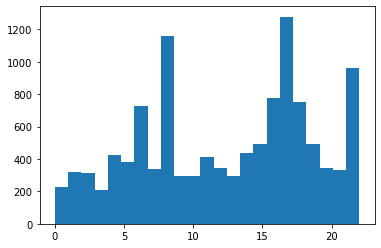

In [81]:
classes = []
bboxes = []
for annotation in annotations:
    cls = annotation['category_id']
    bbox = annotation['bbox']
    classes.append(cls)
    bboxes.append(bbox)
p = plt.hist(classes, bins=len(set(classes)))

In [82]:
bboxes = np.stack(bboxes, axis=0)
bboxes.shape

(11596, 4)

Text(0.5, 1.0, 'bbox size')

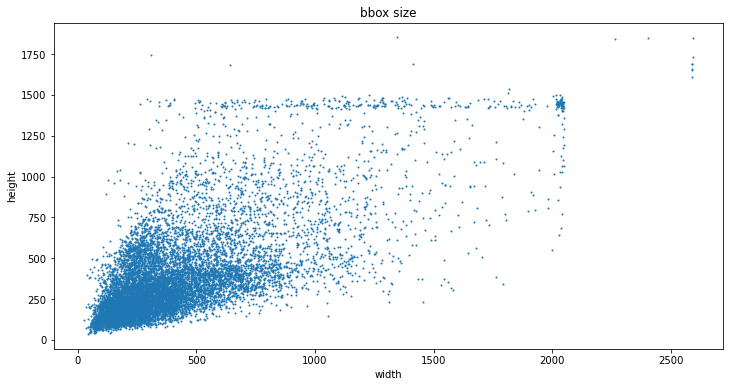

In [91]:
plt.figure(figsize=(12,6))
plt.scatter(bboxes[:, 2], bboxes[:, 3], s=1)
plt.xlabel('width')
plt.ylabel('height')
plt.title('bbox size')

In [58]:
classes = np.array(classes)
df = pd.DataFrame(data=classes, columns=['category'])
df.head()

,category
0,0
1,0
2,1
3,2
4,2


In [74]:
val_count = df.category.value_counts()

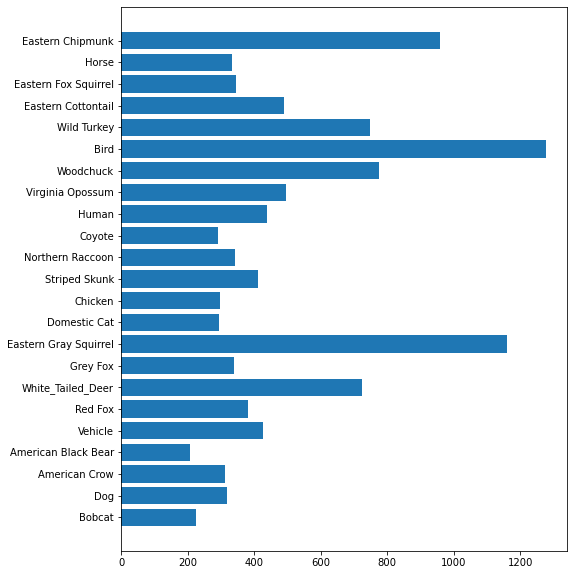

In [73]:
#p = plt.barh(val_count.index,val_count.values)
plt.figure(figsize=(8,10))
p = plt.barh(val_count.index, val_count.values, tick_label=class_names)

In [9]:
id_bbox_dict = dict()
multi_object_k = 0
for annotation in annotations:    
    image_id = annotation['image_id']
    bbox = annotation['bbox']
    category_id = annotation['category_id']
    
    image_id = image_id
           
    bbox = np.array(bbox, dtype=np.int)
    x, y, w, h = bbox
    bbox = [int(category_id), y, x, y+h, x+w]
    #print('image_id',image_id, 'category',category_id,'bbox', bbox)
    
    if image_id in id_bbox_dict.keys():
        id_bbox_dict[image_id].extend(bbox)        
        multi_object_k += 1
    else:
        id_bbox_dict[image_id] = bbox
        
len(id_bbox_dict.keys()), multi_object_k

(9676, 1920)

In [92]:
annotation = dict()
for file_name in file_name_id_dict.keys():
    file_full_path = path_image + file_name
        
    file_id = file_name_id_dict[file_name]
    bboxes = id_bbox_dict[file_id]
    bboxes_2d = np.reshape(bboxes, [-1, 5])
    
    if os.path.isfile(file_full_path):        
        annotation[file_full_path] = bboxes_2d
    else:
        continue
len(annotation), type(annotation)    

(8789, dict)

In [93]:
input_list = []
bbox_list = []
image_size_list = []
for file_name in file_name_id_dict.keys():
    if np.random.rand()<0.9:continue
    file_full_path_train = path_image + file_name
        
    file_id = file_name_id_dict[file_name]
    bboxes = id_bbox_dict[file_id]
    bboxes_2d = np.reshape(bboxes, [-1, 5])
    cls = bboxes_2d[:, :1]
    boxes_2d = bboxes_2d[:, 1:]
        
    if os.path.isfile(file_full_path_train):
        img = Image.open(file_full_path_train)
        img_arr = np.array(img)
                
        h, w, c = img_arr.shape
        image_size_list.append((w, h))
        scale = np.array((h, w, h, w))
        scale = np.reshape(scale, (1, 4))
        box_norm = boxes_2d.astype(np.float) / scale.astype(np.float)        
        #print(cls, box_norm)
        cls_bbox_norm = np.concatenate((cls, box_norm), axis=1)
        
        input_list.append(img_arr)
        bbox_list.append(cls_bbox_norm)    
        if len(input_list)%100==0:
            print('reading image', len(file_name_id_dict.keys()), len(input_list))        
        if len(input_list)>=100:
            break
print('input_list', len(input_list))

reading image 9676 100
input_list 100


In [104]:
set(image_size_list)

{(1920, 1080), (2048, 1536), (2592, 1944)}

Text(0, 0.5, 'image_height')

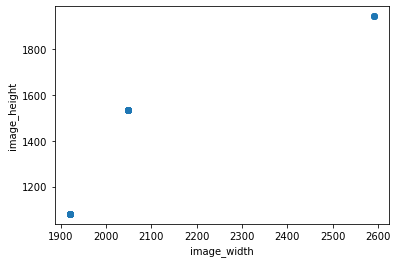

In [98]:
image_sizes = np.stack(image_size_list)
image_sizes.shape
plt.scatter(image_sizes[:, 0], image_sizes[:, 1])
plt.xlabel('image_width')
plt.ylabel('image_height')

{'whiskers': [<matplotlib.lines.Line2D at 0x7f5e870f20d0>,
 'caps': [<matplotlib.lines.Line2D at 0x7f5e870982b0>,
 'boxes': [<matplotlib.lines.Line2D at 0x7f5e870f27c0>],
 'medians': [<matplotlib.lines.Line2D at 0x7f5e87098970>],
 'fliers': [<matplotlib.lines.Line2D at 0x7f5e87098c70>],
 'means': []}

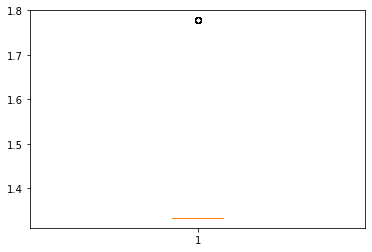

In [103]:
plt.boxplot(1.0*image_sizes[:, 0]/image_sizes[:, 1])

In [77]:
bboxs = np.concatenate(bbox_list, axis=0)
bboxs.shape

(111, 5)

In [50]:
def visualize_detections(
    image, boxes, classes, figsize=(12, 12), linewidth=1, color=[0, 0, 1]
):
    """Visualize Detections"""
    image = np.array(image, dtype=np.uint8)
    img_h, img_w, img_c = image.shape
    plt.figure(figsize=figsize)
    plt.axis("off")
    plt.imshow(image)
    ax = plt.gca()
    boxes_width = boxes[:, 3] - boxes[:, 1]
    boxes_height = boxes[:, 2] - boxes[:, 0]
    box_min_width = np.min(boxes_width)
    box_max_width = np.max(boxes_width)
    title = str.format('(%dx%d) %d box, width:%d ~ %d' 
                       %(img_h, img_w, len(boxes), box_min_width, box_max_width))
    plt.title(title)
    for box, cls in zip(boxes, classes):
        y1, x1, y2, x2 = box        
        w, h = x2 - x1, y2 - y1
        patch = plt.Rectangle(
            [x1, y1], w, h, fill=False, edgecolor=color, linewidth=linewidth
        )
        ax.add_patch(patch)
        cls = int(cls)
        txt = str(cls)+' '+ class_names[int(cls)]
        ax.text(x1, y1, txt, bbox={"facecolor": (0,0,1), "alpha": 0.4}, clip_box=ax.clipbox, clip_on=True,)
   
    plt.show()
    return ax

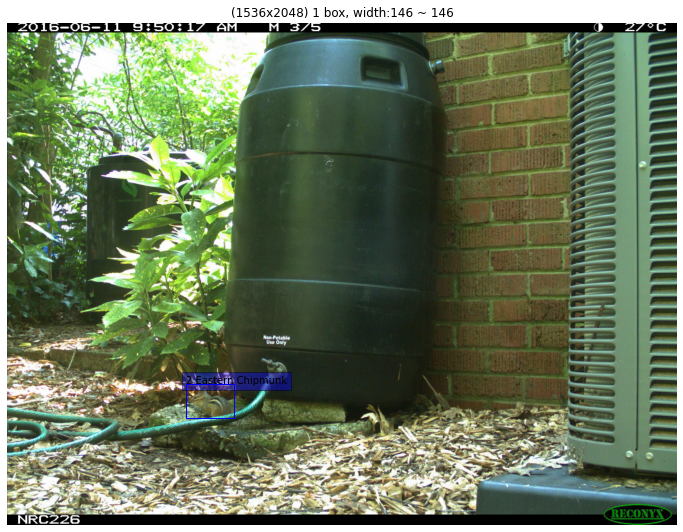

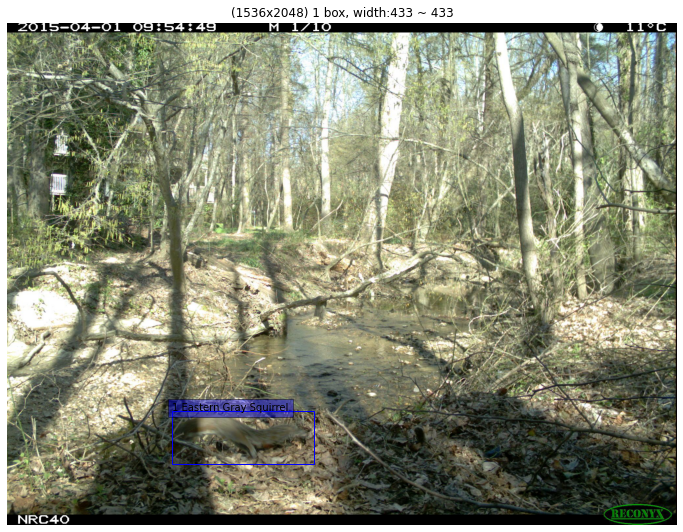

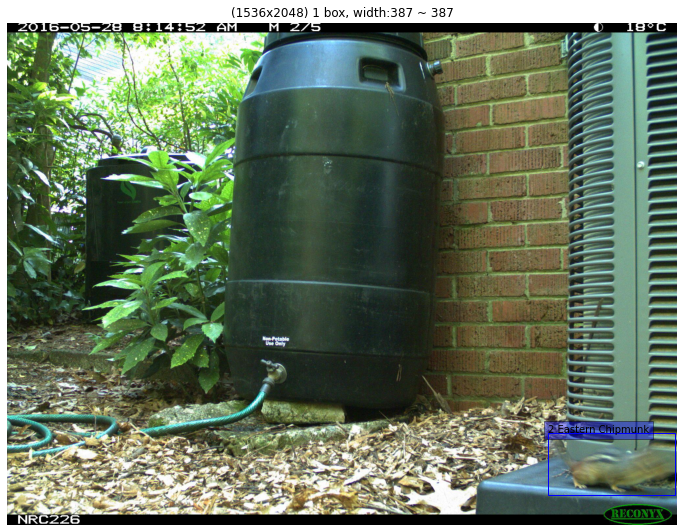

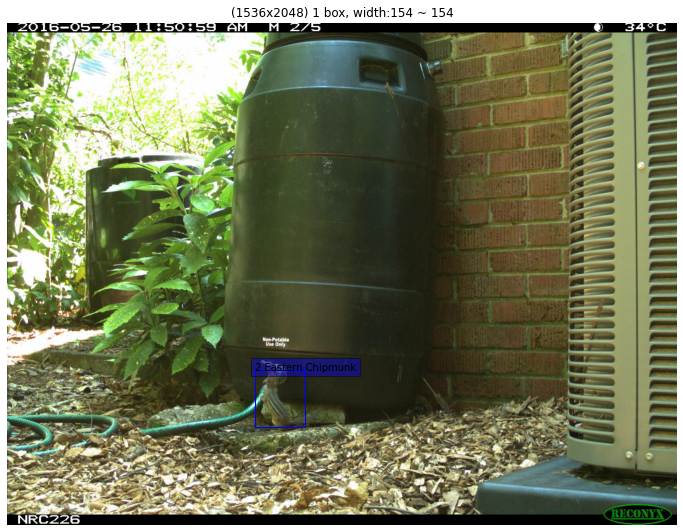

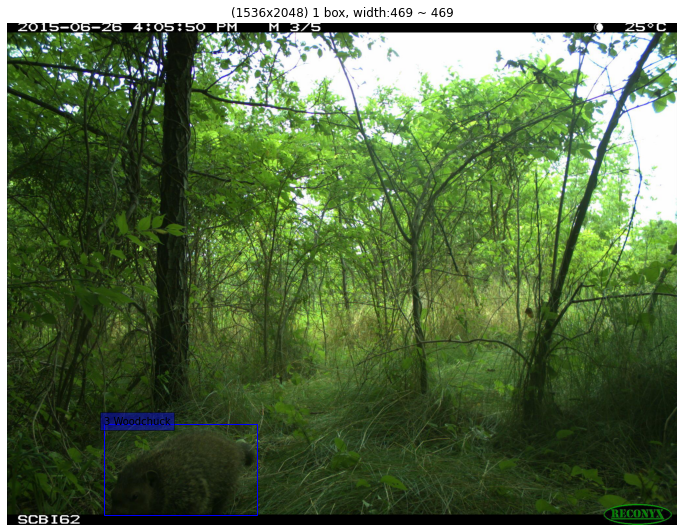

...

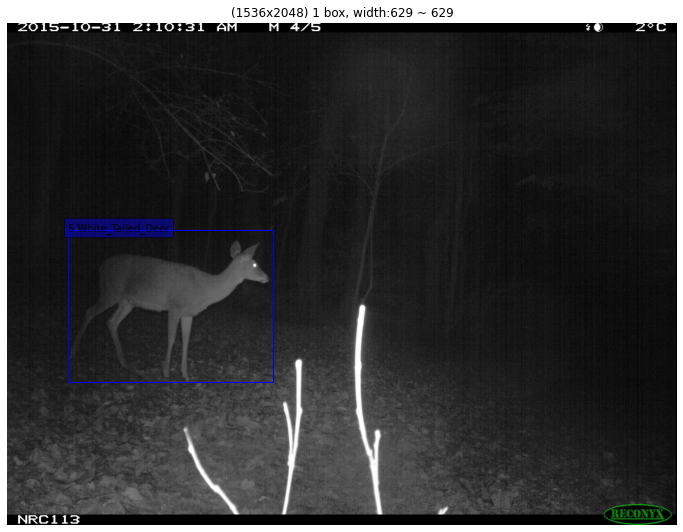

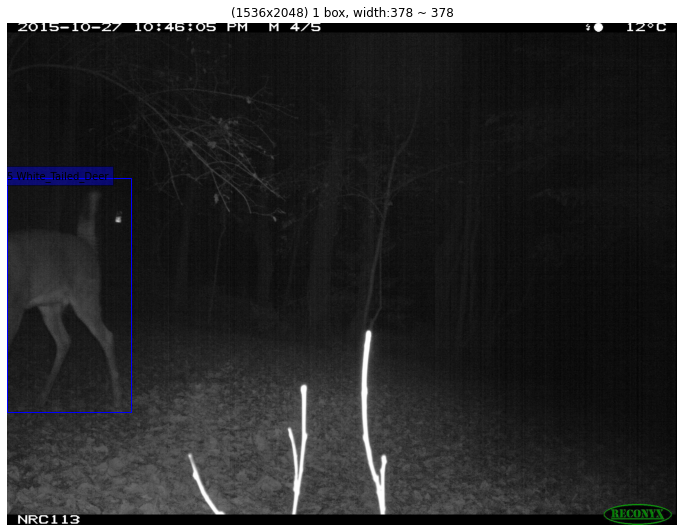

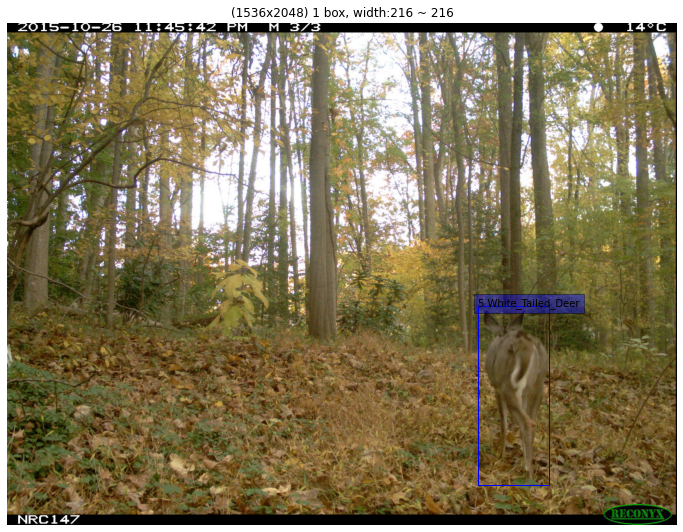

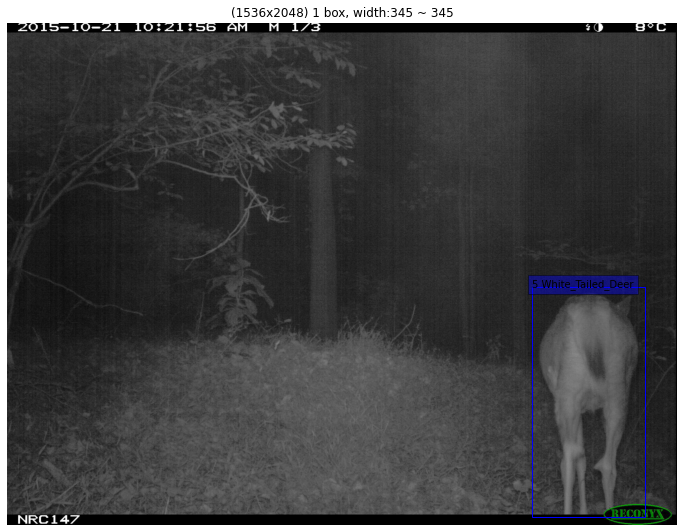

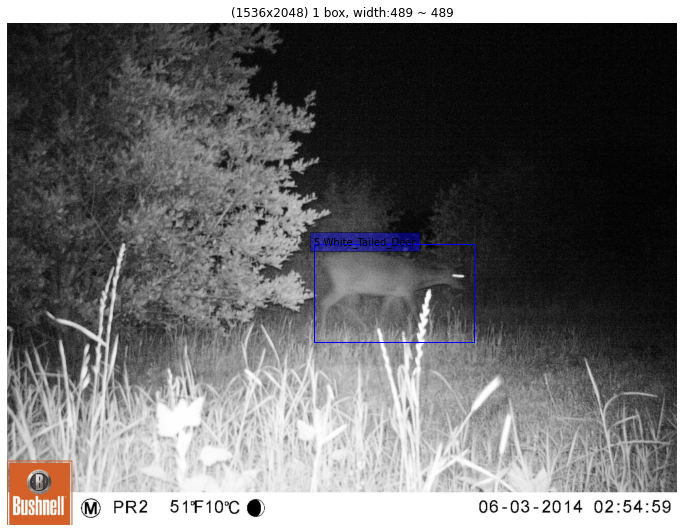

In [51]:
for i in range(len(input_list)):
    if i%5==0:
        img_arr = input_list[i]
        sample_box = bbox_list[i]
        label = sample_box[:, 0]
        bbox = sample_box[:, 1:]

        h, w, c = img_arr.shape
        scale = np.array((h, w, h, w))
        scale = np.reshape(scale, (1, 4))
        bbox_norm = bbox.astype(np.float) * scale.astype(np.float)
        #print('bbox_norm', bbox, bbox_norm)
        ax = visualize_detections(img_arr,bbox_norm,label)